# 

# Energy-Based Models (EBM)

Diffusion model is energy based, so let's start from energy-based models.

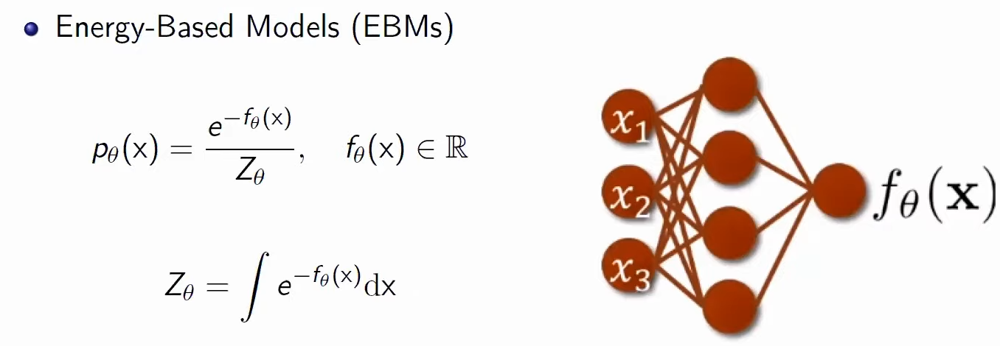

f<sub>θ</sub>(x) - potential energy function (range from -inf to +inf) of object x. Potential energy tells us about probability of sampling object x from distribution (high potential energy - low probability and vise versa). Example of potential energy function implementation - some neural net.

p<sub>θ</sub>(x) - probability density

Z<sub>θ</sub> - normalization constant, is used to make p<sub>θ</sub>(x) vary from 0 to 1.

Advantages of energy base models:

- it's simple and fast if it's already trained

Disadvantages of energy base models:

- training is a real problem, because if we want to train through MLE, we need to evaluate this:

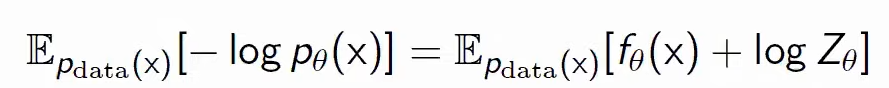

We know how to calculate first term, but calculation of the second term (log(Z<sub>θ</sub>)) is very-very expensive.

How to solve this?

## Score matching

Let score function be

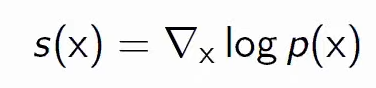

Score function for EBM

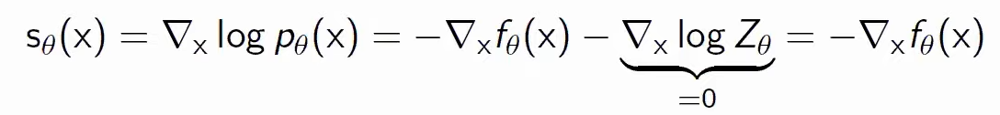

Gradient of Z<sub>θ</sub> if 0 because Z<sub>θ</sub> is a constant.

## Main idea

So instead of maximizing of likelihood let's mimize difference between the real score function and score function of our model.

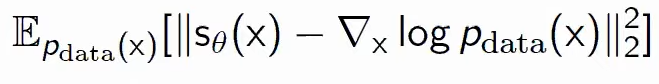

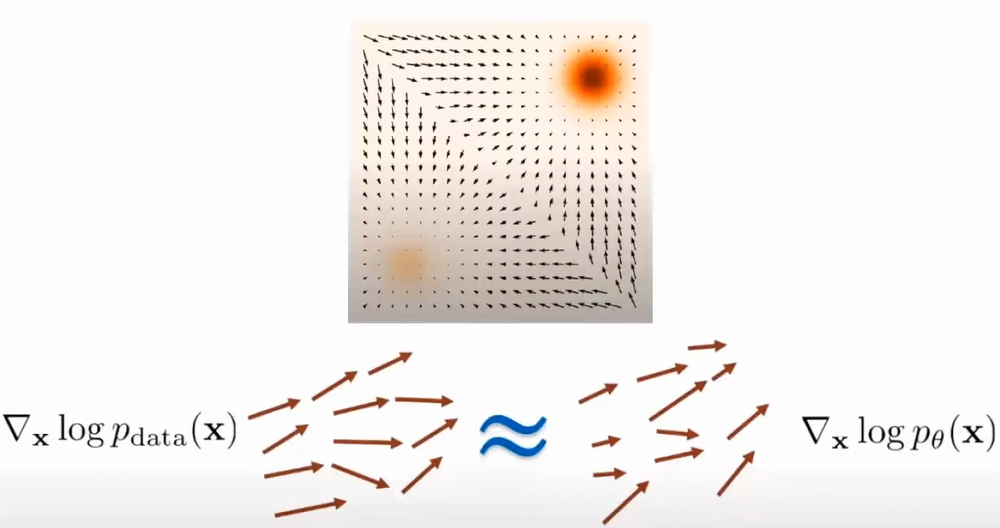

But we don't know how to calculate the real score function (p<sub>data</sub>). We have access only to some samples of the dataset. How to convert them to distribution? The answer is **Denoising score matching** and **Sliced score matching**.

## Train score matching: Denoising score matching

Main idea: let's just noise our data, so we can generate as much data as we want with noising and this will help to turn our discreete data to continous distribution.

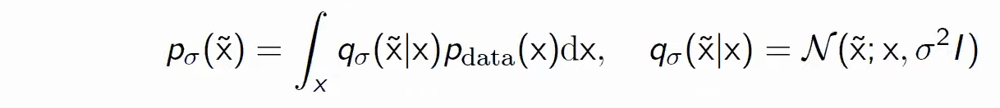

Score matching for noised data

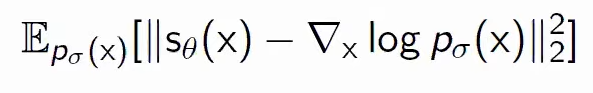

Can be rewrited as

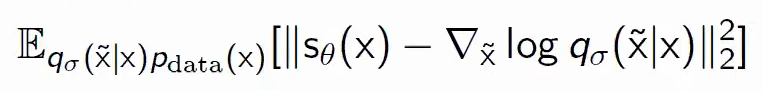

## Train score matching: Sliced score matching

Main idea: rewrite score matching to be able to access p<sub>data</sub>

Multidimensional case:

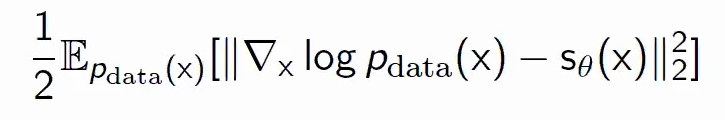

Let's derive Sliced score matching for 1-dimension case

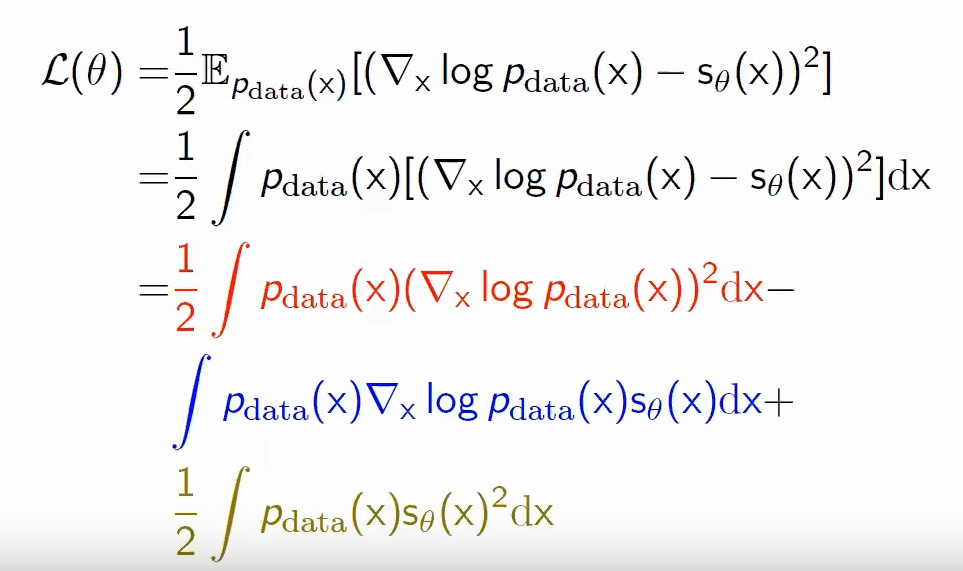

First term doesn't depend on θ (so we ignore him), third term is easy to evaluate.

Let's consider second term:

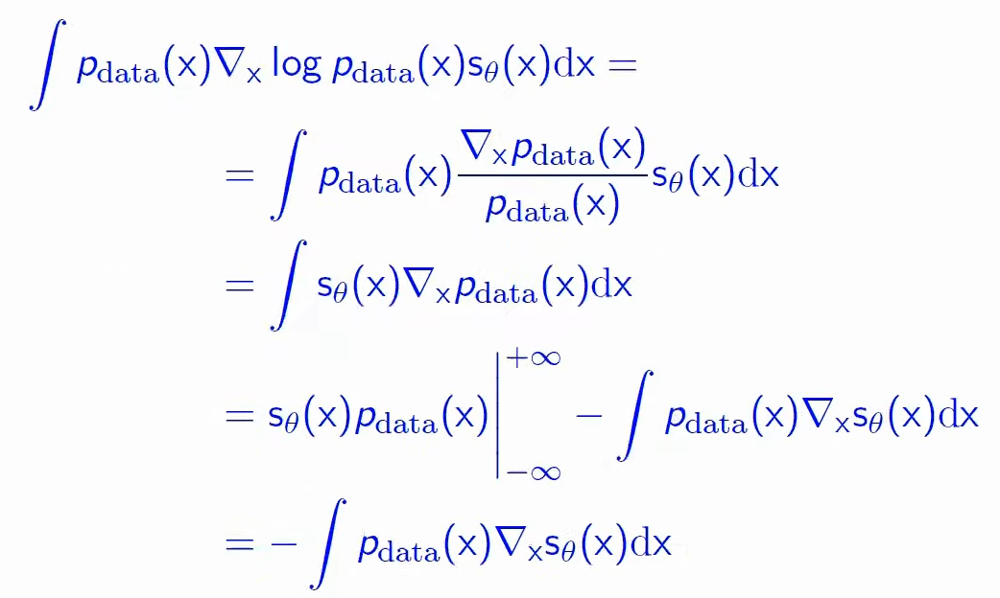

First term in result is equal to zero because we suppose that probability density -> 0 for x -> -inf or +inf. So only second term is left.

Now let's join together again second and third terms:

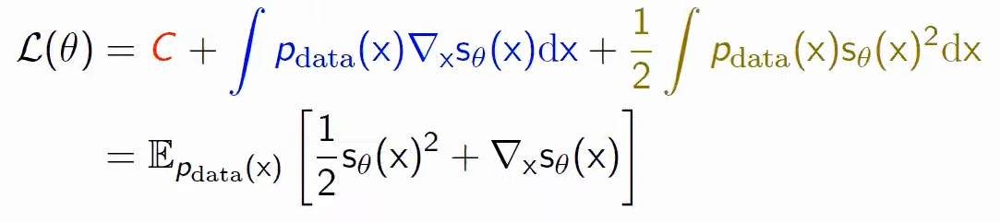

For multidimensional case:

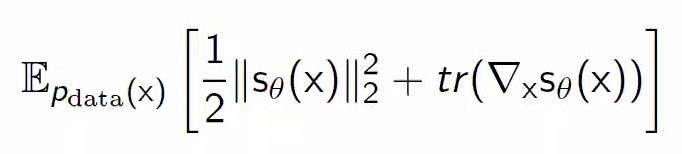

Now with this formula we don't need access to the real score function

But this formula will be calculated for too long because if s<sub>θ</sub> is some neural net - we need to do O(D) backpropagations of s<sub>θ</sub> to calculate trace (D - the number of dimensions).

### Sliced score matching: Hutchinson trace estimator

Helps to speed-up trace calculation:

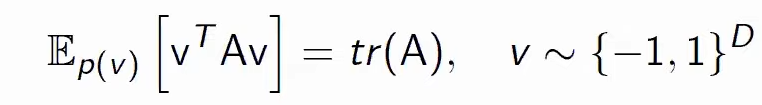

This works because diagonal elements of matrix are twice multiplied on the same element of v (-1 or 1) and any else element with equal probability (0.5) will be multiplied by -1 or 1. So the expectation for A<sub>ii</sub> will be A<sub>ii</sub> and expectation for A<sub>ij</sub> = - 0.5 * A<sub>ij</sub> + 0.5 * A<sub>ij</sub> = 0.

So score matching formula can be rewritten as

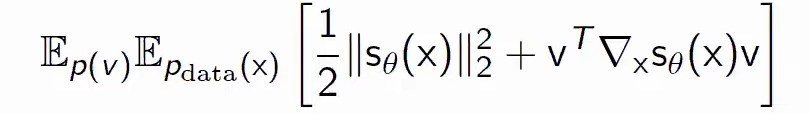

And with **Vector Jacobian Product (VJP)** we can calculate backpropagation with O(1) complexity

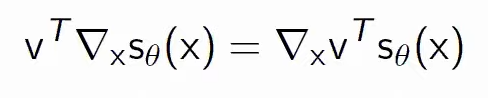

Main idea of VJP: multiply vector output of function s<sub>θ</sub> (or any other function) on v<sup>T</sup> and get one number instead of vector. This lets us make one backpropagation instead of making multiple backpropagations for every element of vector. 

## Score matching: data sampling

We need to be sure that our data is sampled from the real distribution

Use **Langevin dynamics**

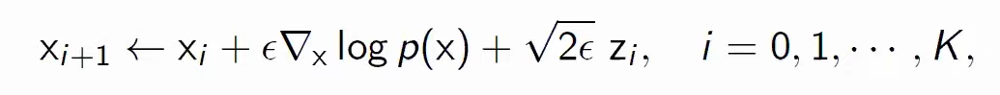

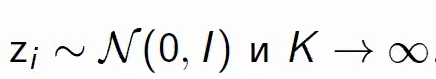

If ε is small enough and K -> inf: X<sub>K</sub> is sampled from the real distribution

## Score matching: pipeline

1. Set model
    - set as EBM and evaluate score function

    or
    
    - set score function
2. Train score matching
    - denoising score matching

    or
    
    - sliced score matching
3. Sample with Langevin dynamics

But if we use it as it is, we will get this

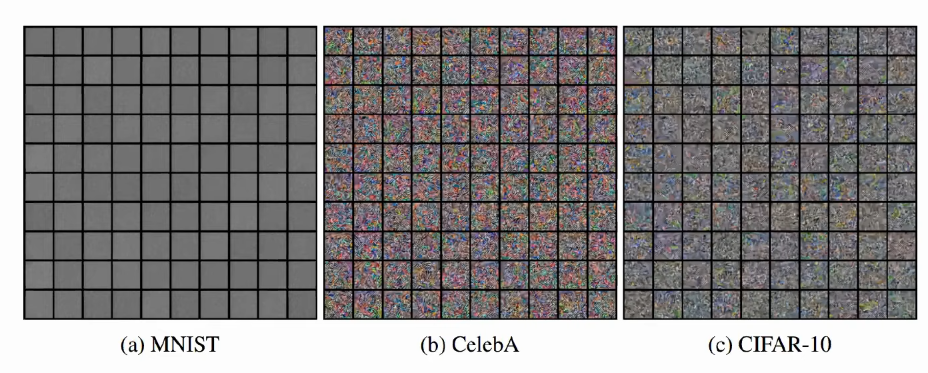

But why?

## Score matching: problems

1. We know nothing about regions where there is no data.  

    Usual structure of data is couple of modes and nothing between them. Gradients in the places between modes can be arbitrary and function can return any result.

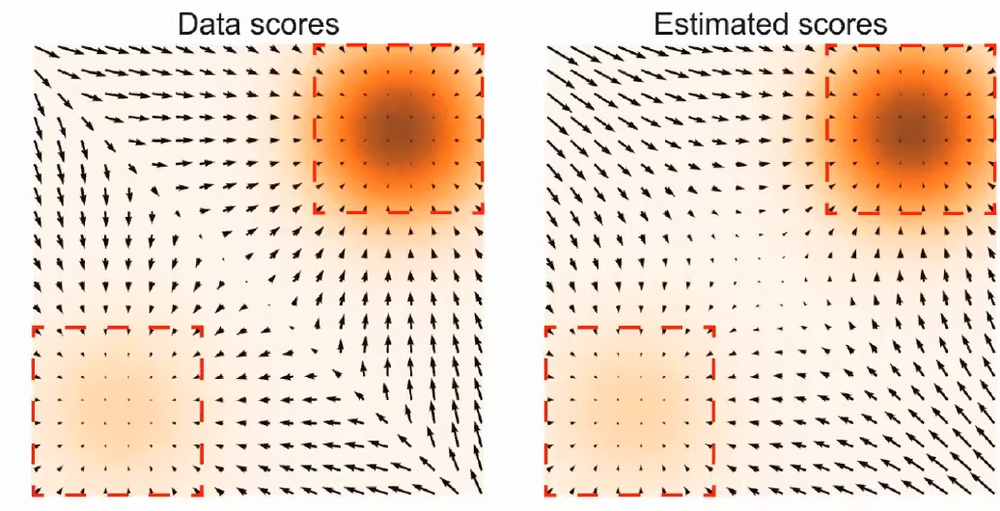

2. Score matching train is unstable (left).

    Reason is similar to the first point (dimensiality of data is much lower than dimesiality of space which contains that data -> model learns very narrow distributions and small change of data leads to a huge loss). Adding of noise stabilizes the training (right) because this operation increases dimensiality of data.

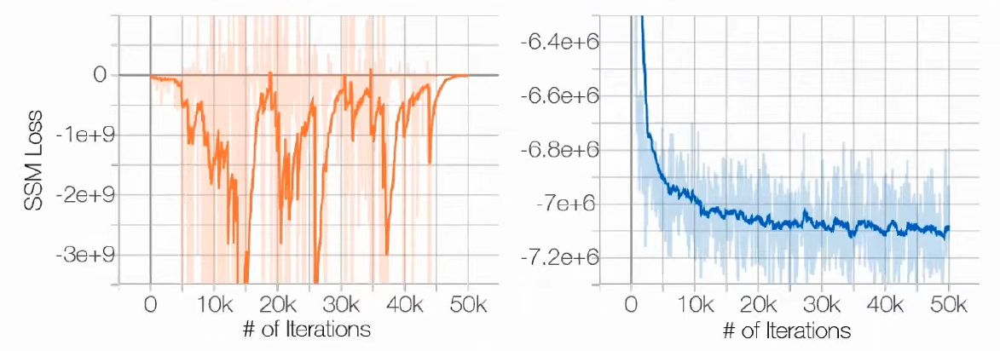

3. Langevin dynamics can't move between modes when there are no data

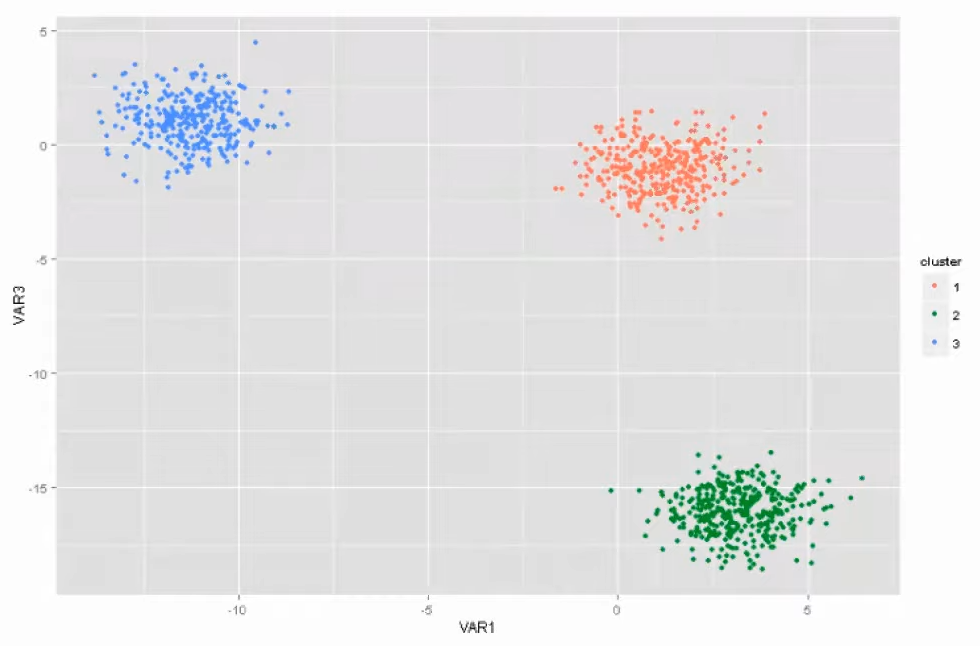

All of this problem can be solved with data noising. But with huge noising that won't be the data that we want and not the same distribution that we want. So we have a tradeoff: huge noising stabilizes the training and helps to merge the modes with each other but it changes the data and distribution.

Solution is **multilevel noising**.

## Score matching: multilevel noising

Main idea: add noise gradually by levels. On each level noise amount is increased. θ is trained to evaluate score function s<sub>θ</sub> for any σ<sub>i</sub>.

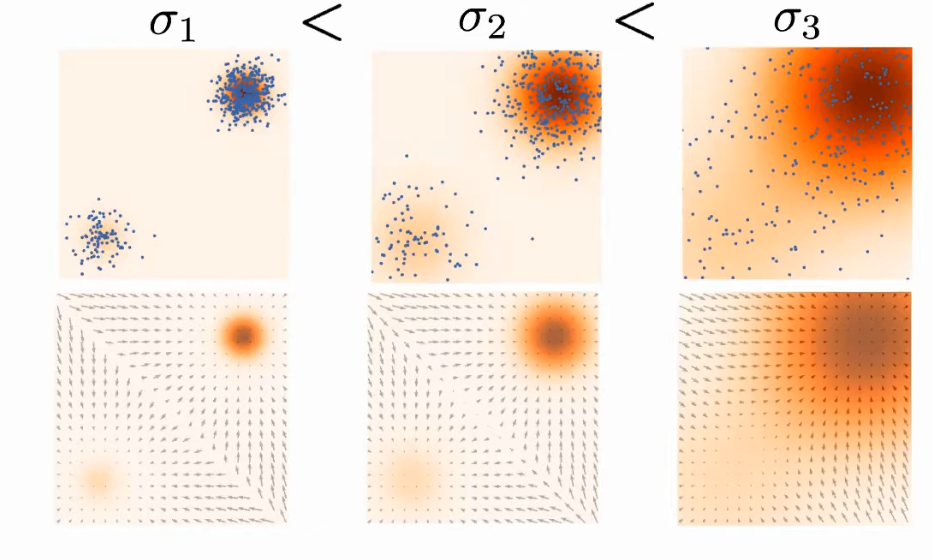

**How to do it?**

Make score function for each level

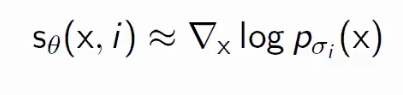

And train multilevel score matching

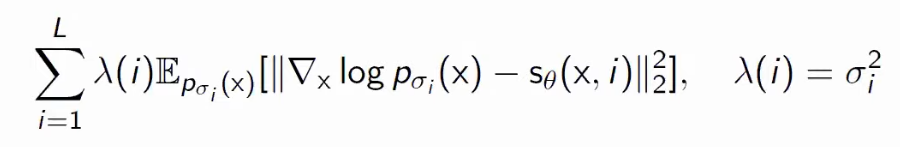

## Diffusion Model with Multilevel Noising: Noise Condition Score Network (NCSN)

For each noise level (L levels total) algorithm makes T samples using Langevin dynamics. Authors used L=10 and T=100.

Maybe on line 2 there is a mistake: must be i <- L to 1 and this makes α decrease with level number increase.

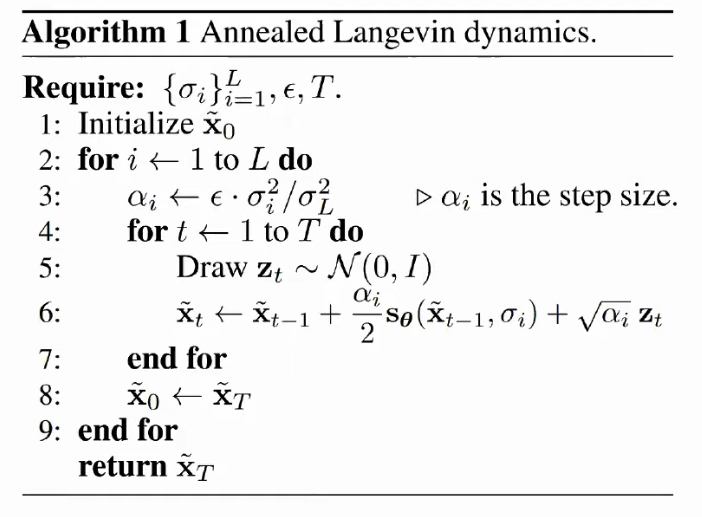

## NCSN: result

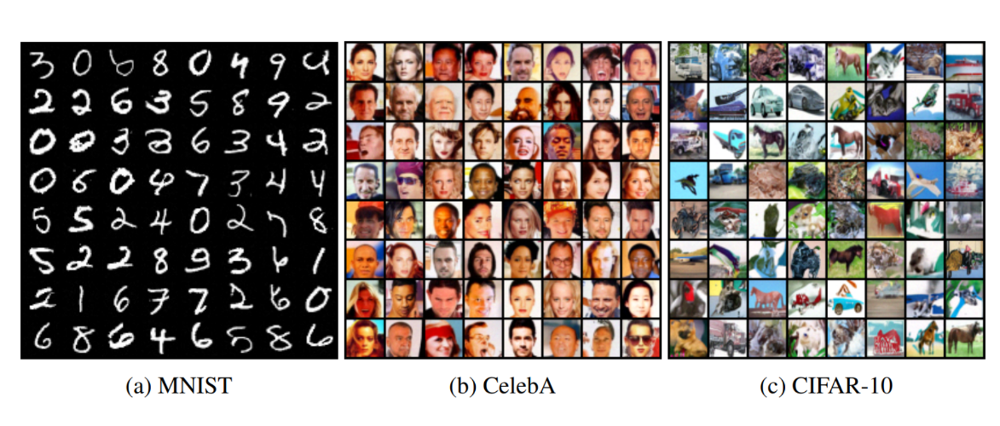

# Denoising Diffusion Probabilistic Model (DDPM)

Main idea: gradually add noise to image and train model to denoise image. Noise has multidimensional normal distribution (because it's added to multiple pixels, every pixel has it's own noise component).

Original DDPM is unconditional model - image generation results are depend on original distribution and input noise, you can't ask model to generate some specific image.

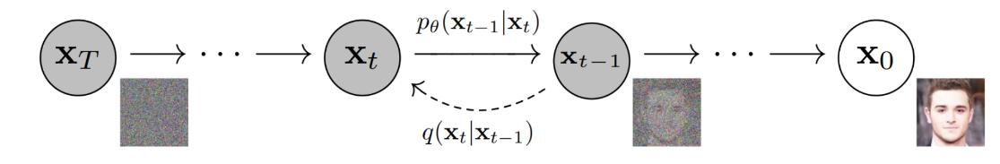

## DDPM: data noising

Noising process is a Markov's Chain. p is a probability of x<sub>t-1</sub> moving to x<sub>t</sub> through noising process, q is a probability of opposite denoising process. β<sub>t</sub> - some coefficients that linearly grow from 1e-4 to 1e-2 with t increasing and they control noise level (more β<sub>t</sub> - less noise). That eventually leads to signal level decreasing and noise level increasing. β<sub>t</sub> coefficient values are selected in such a way that only noise remains in the end and that noise is normally distributed.

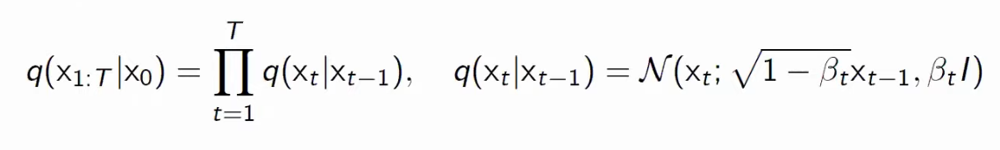

Multistep noising (we can replace multiple noising steps with just one)

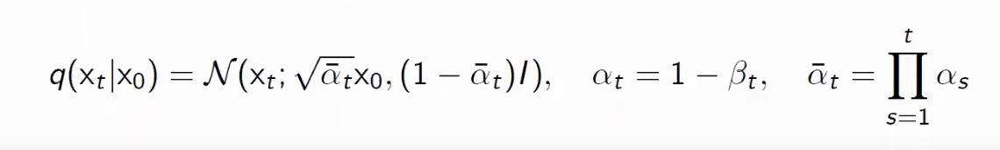

## DDPM: data denoising

In the begining of formula there is a mistake: must be p<sub>θ</sub>(x<sub>0:T</sub>), not p<sub>θ</sub>(x<sub>0:T</sub>|x<sub>0</sub>).

Denoising distribution is normal, i.e. we use DL model to transform more noisy normal distribution to less noisy normal distribution (we return parameters of this distribution: mean and variance)

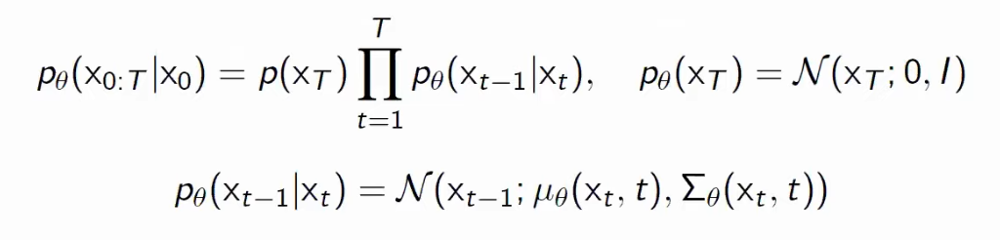

### Data denoising: how to train θ?

Let's train it with MLE

At first let's write what p<sub>θ</sub>(x<sub>0</sub>) is:

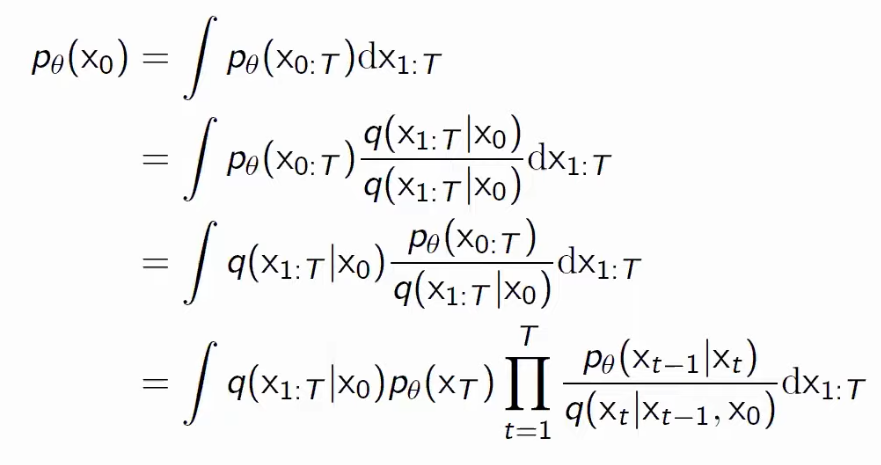

During inference we used the fact that

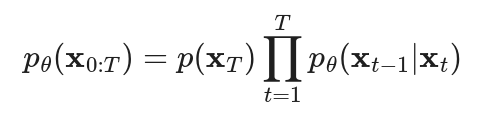

You can prove this fact if use Bayes formula to transform p<sub>θ</sub>(x<sub>t-1</sub>|x<sub>t</sub>) to p<sub>θ</sub>(x<sub>t</sub>|x<sub>t-1</sub>) * p<sub>θ</sub>(x<sub>t-1</sub>) / p<sub>θ</sub>(x<sub>t</sub>) and calculate production of these terms from 1 to T.

### Data denoising: MLE formula

1. Paste p<sub>θ</sub>(x<sub>0</sub>) into the formula. 
2. Calculate Evidence Lower Bound (ELBO) for it. 
3. Now we can join two integrals of q(x<sub>0</sub>) and q(x<sub>1:T</sub>|x<sub>0</sub>) to integral of q(x<sub>0:T</sub>). 
4. Convert log of production to sum of logarithms.

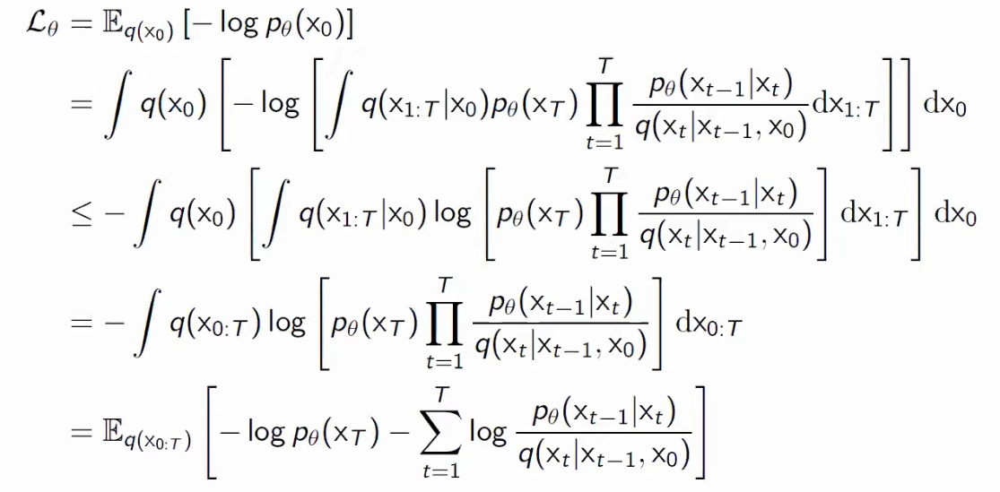

5. Rewrite formula with separate sum term (mistake in formula: q(x<sub>1</sub>|x<sub>0</sub>) instead of q(x<sub>t</sub>|x<sub>1</sub>, x<sub>0</sub>))
6. Use Bayes formula to translate 1 / q(x<sub>t</sub>|x<sub>t-1</sub>, x<sub>0</sub>) to q(x<sub>t-1</sub> | x<sub>0</sub>) / (q(x<sub>t-1</sub>|x<sub>t</sub>, x<sub>0</sub>) * q(x<sub>t</sub> | x<sub>0</sub>)) (in denominaotor), there is also mistake in formula on image: q(x<sub>t-1</sub> | x<sub>0</sub>) instead of p<sub>θ</sub>(x<sub>t-1</sub> | x<sub>0</sub>)
7. If we calculate production of q(x<sub>t-1</sub> | x<sub>0</sub>) / q(x<sub>t</sub>|x<sub>0</sub>) for t in 1 to T we will get q(x<sub>1</sub> | x<sub>0</sub>) / q(x<sub>T</sub> | x<sub>0</sub>) (adjucent terms destroy each other), and in the denominator of the last term we also have q(x<sub>1</sub> | x<sub>0</sub>) (as we know from 5., formula has mistake), so they destroy each other and we have only 1 / q(x<sub>T</sub> | x<sub>0</sub>). Let's put it off the sum.
8. And if we look at the result we will see that first and second terms are KL-divergences.

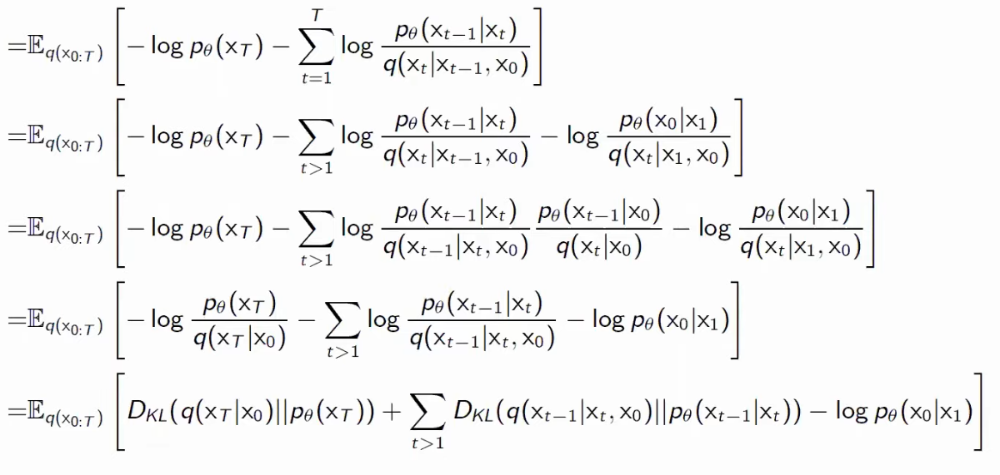

In another words we try to minimize difference between the real probabilitity distribution of less noisy image given more noisy image (q) and the output probability distribution of our model (p<sub>θ</sub>). So that loss teaches our model to denoise the pircture.

Another representation of this loss:

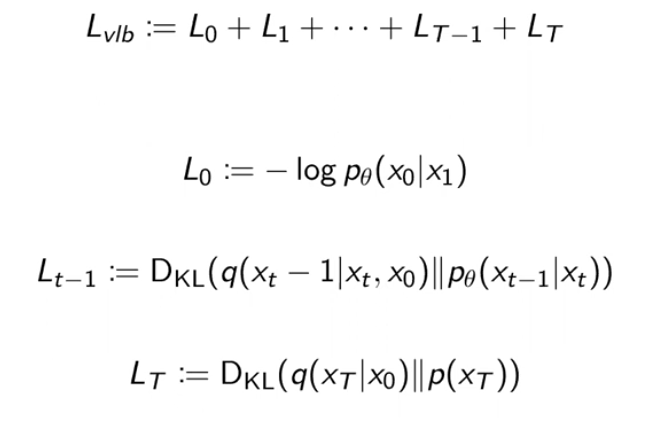

9. First and third terms (L<sub>0</sub> and L<sub>T</sub>) are constansts. 

Let's have a close look to the second term. q(x<sub>t-1</sub> | x<sub>t</sub>, x<sub>0</sub>) has Gaussian distribution. Parameters μ<sub>t</sub> and β<sub>t</sub> can be found because we know distribution of q on each step.

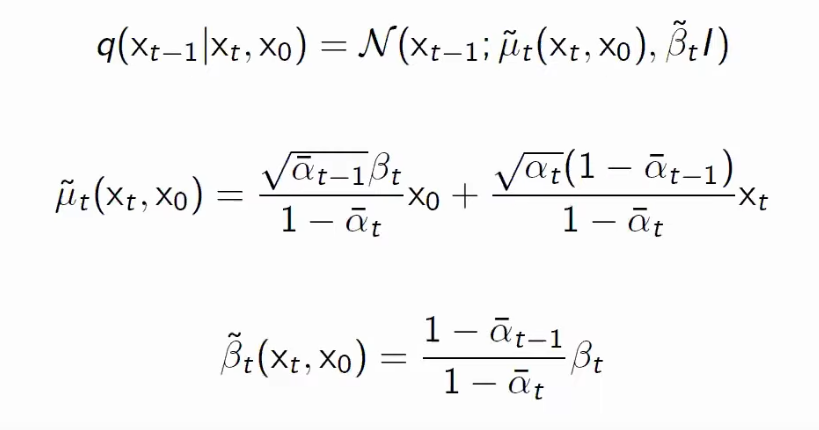

10. Now let's calculate KL-divergence between p and q. Both of them has Gaussian distribution. 

We also make covariate matrices of p and q diagonal to simplify KL-divergence calculation (i.e. noise that added to every pixel doesn't depend on noise that was added to any other pixel):

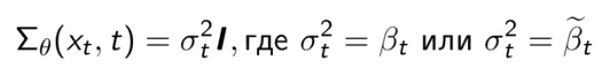

And now the only parameter we need to predict is **the mean of noise that was added to every pixel on step t** - i.e. the result is matrix of the same size that image has, and every element of this matrix is the mean of noise that should be added to corresponding pixel of image to denoise that image. 

Then KL-divergence (and our loss function) for step t-1 will be:

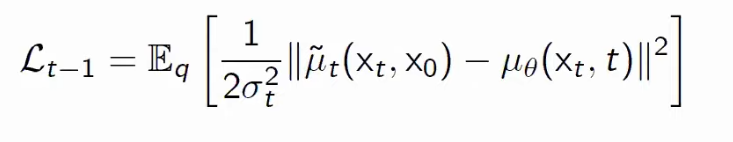

11. Formula on step 10 is our objective. We are already can train model from this step. But we can additionally simplify the calculation by parametrizing μ<sub>θ</sub> to make it similar to μ<sub>t</sub>. To do that let's set x<sub>0</sub> as

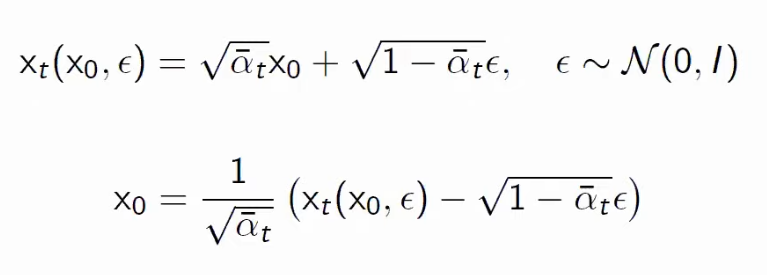

12. Then rewrite KL-divergence for step t-1:

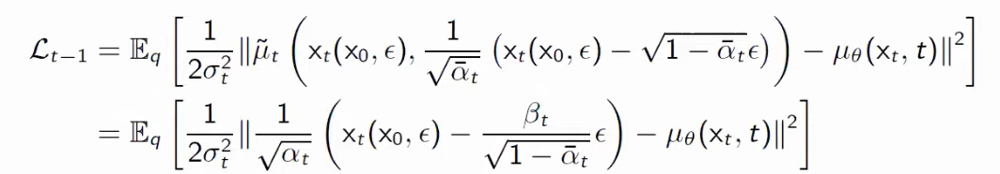

13. Let's build μ<sub>θ</sub> via the same formula as μ<sub>t</sub> and parametrize it with some paramter ε<sub>θ</sub>:

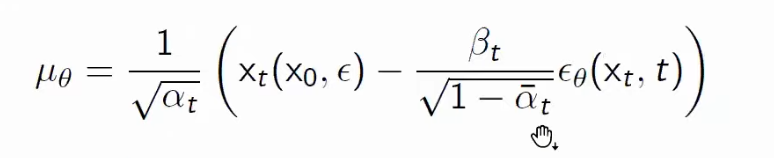

14. And now KL-divergence for step t-1 will be:

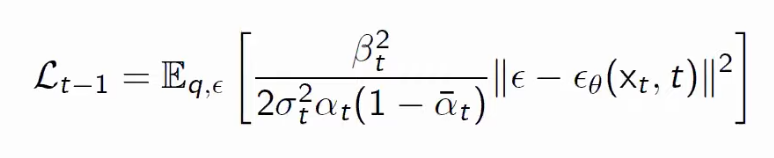

Where ε<sub>θ</sub> is some NN that takes x<sub>t</sub> and t as inputs and learns objective L<sub>t-1</sub>. So it's MSE loss between noise, that was added to picture and output of the DL model. So we don't predict denoised image but we predict the noise that was added to that picture. Authors tried to learn model via formula from step 10 and via formula from step 14 and the last formula gives better results.b

15. We can additionaly simplify our loss and remove huge coefficient and it will be turned out to

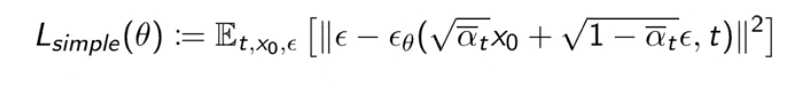

Or, if we simplify the second term:

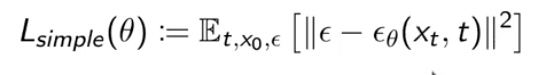

Again, this loss is MSE between noise that was added to image and noise that was predicted by our model. This loss is averaged by all steps, all images and all parameters added noise.

## DDPM: Train algorithm

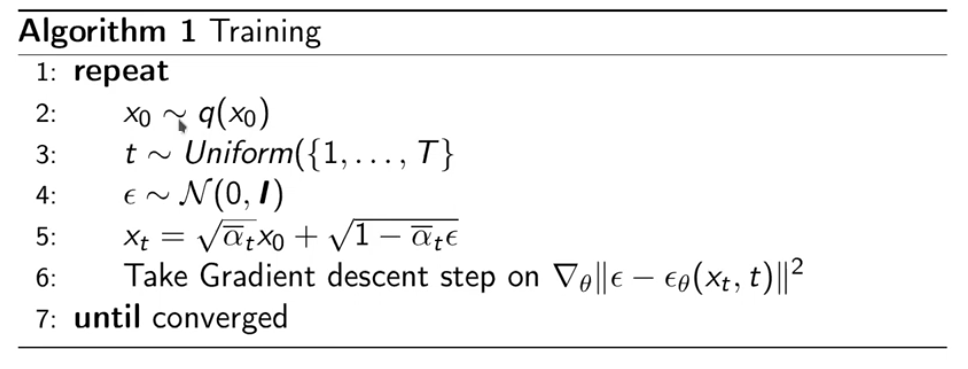

1. Repeat:
2.  sample original image
3.  sample random step t from uniform distribution of {1...T}
4.  sample noise (with the same size as image has) from normal distirbution with mean = 0 and covariance matrix = I
5.  get noised image for step t
6.  make prediction of noise that was added to image and make gradient descent step for loss between our prediction and the real added noise
7. until process is converged

## DDPM: Image generation (sampling) algorithm

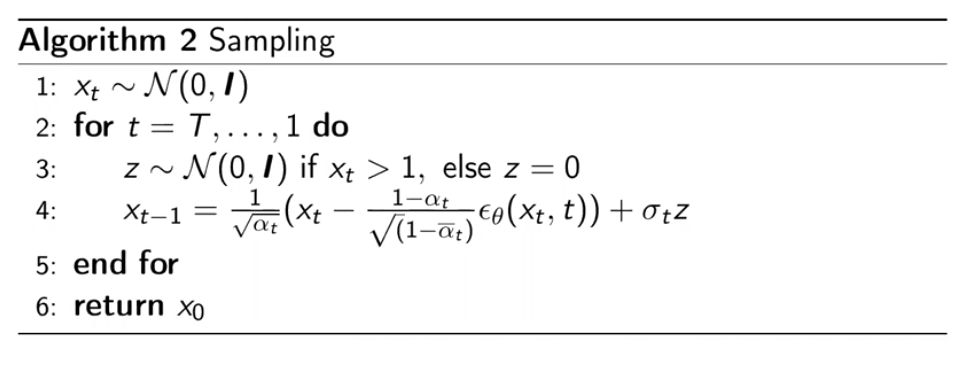

1. Sample noise from normal distribution (with the same size as result image has).
2. for t = T,...,1:
3. get the additional noise
4. predict noise that is added to image on step t, and subtract it from picture + add the additional noise (don't add if t = 1 (step is penultimate))
5. return generated image x<sub>0</sub>

This process is not deterministic, it's probabilistic because we trained probability to get less noisy image given more noisy image.

## DDPM: result

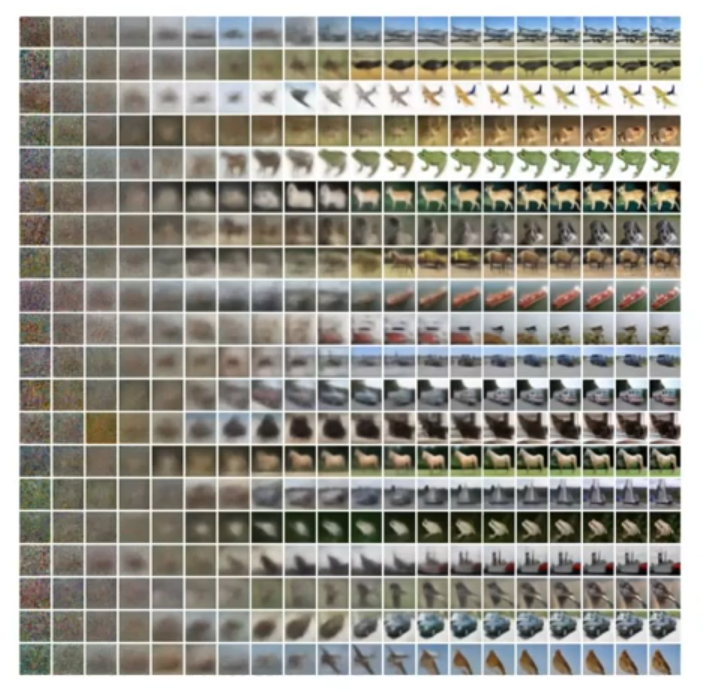

## DDPM: architechture

- UNet-like architechture
- Backbone - Wide ResNet
- Group normalization
- Use positional embeddings to add step information
- Use one-headed attention for decoding step 

## DDPM: additional tricks

### Learn standard deviation

It's hard to predict β<sub>t</sub> directly because it quickly become almost the same for model with any number of steps.

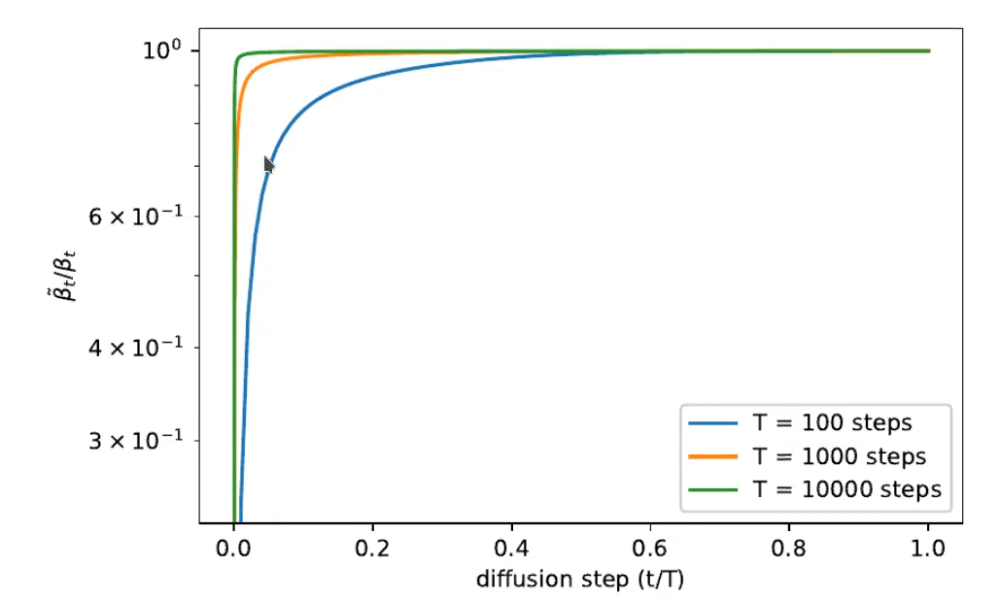

So let's learn interpolation coefficient:

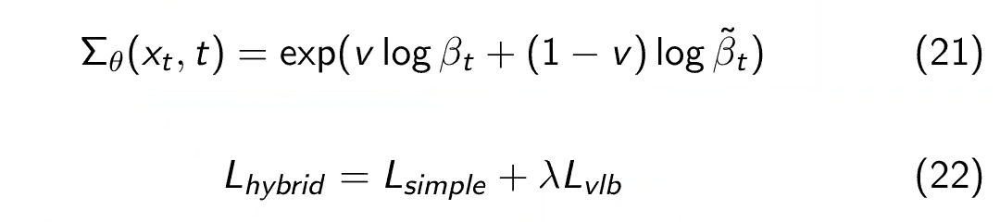

- loss is hybrid
- L<sub>simple</sub> is a loss from original DDPM and it's used for μ<sub>θ</sub>(x<sub>t</sub>, t) only
- L<sub>vlb</sub> is a variational lower bound loss for β<sub>t</sub> and it's used for β<sub>t</sub> only
- λ = 0.001

### DDPM: cosine noise schedule

Main idea: use cosine schedule for α<sub>t</sub> instead of linear

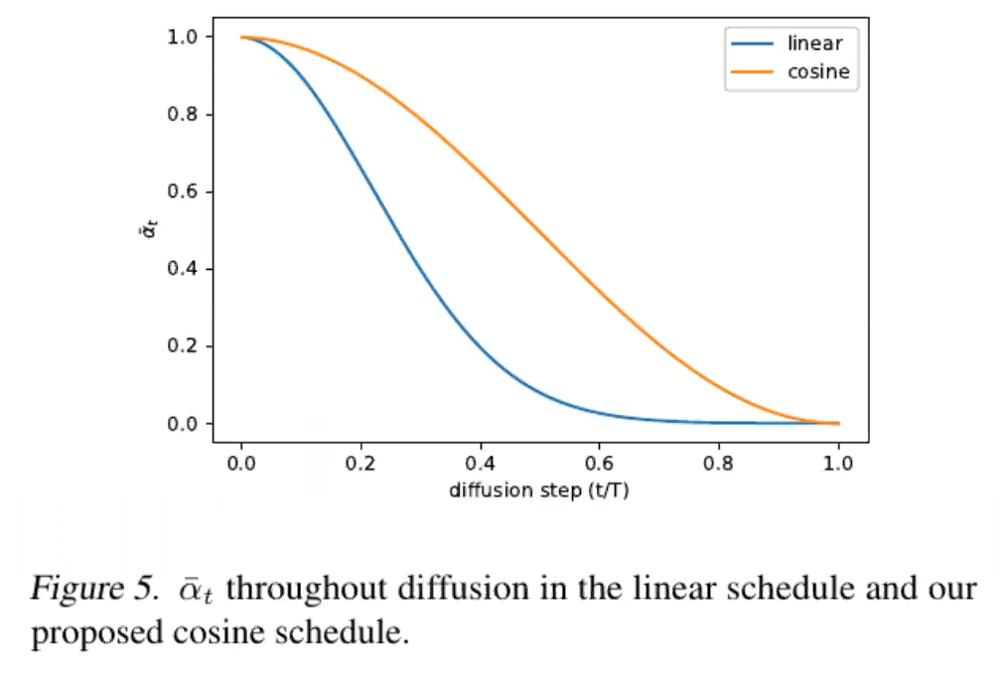

Cosine noise schedule make generation process more smooth

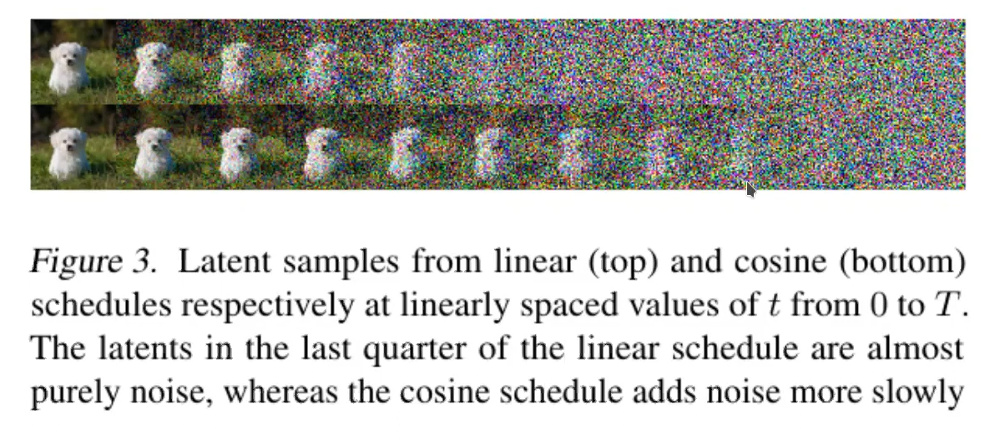

### DDPM: importance sampling

Main idea: hybrid and vlb losses are very noisy, to handle this let's weight loss for every step according to mean loss value that was on this step before importance sampling.

The bigger loss on this step - the smaller loss weight for this step.

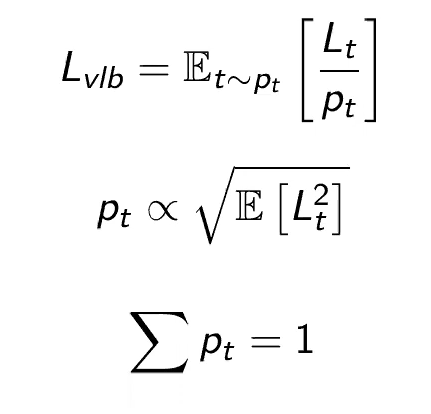

Result

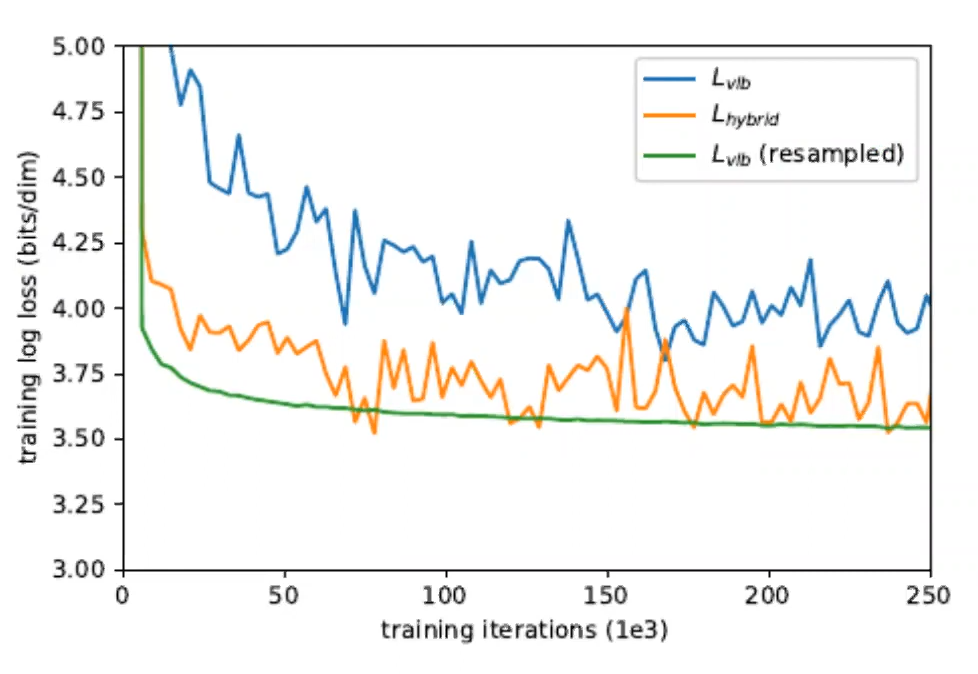

## DDPM: additional tricks

- more deep architechture
- more attention heads
- multi-resolution attention
- BigGAN residual block
- adaptive group normalization
- class embeddings

### DDPM: class embeddings

- take trained model
- train classifier for noisy images
- use gradients of this classifier during image generation

We need to get this (z is a sample from normal distribution)

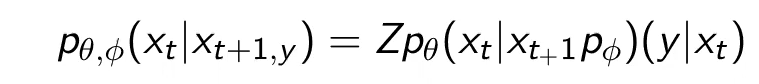

Eventual loss is

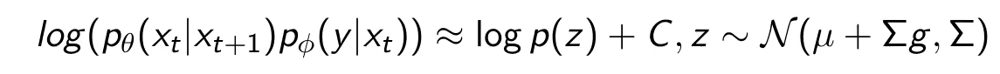

where

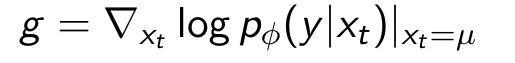

Gradients from classifier are used instead of conv embeddings to prevent one more expensive training process of DDPM.

So we have similar formula that we had for previous model but it biased by covariate matrix multiplied by value of classifier gradients

### DDPM: gradient scale

Main idea: add scale coefficient for classifier gradient, that improves image generation a lot.

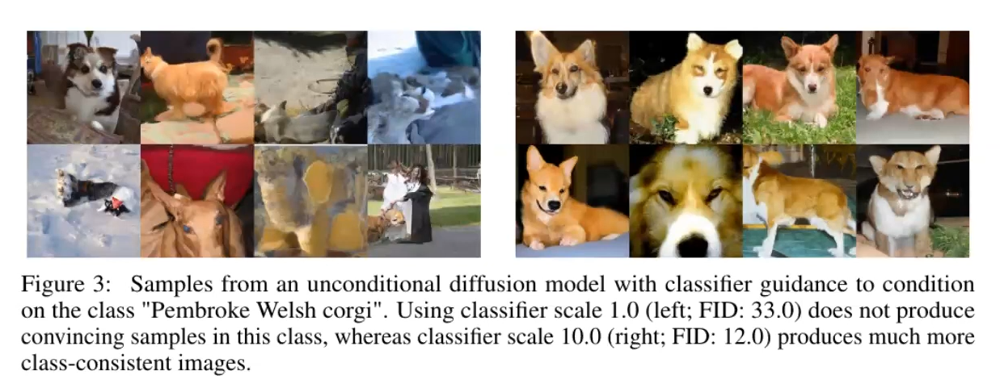

### DDPM + class embeddings + gradient scale algorithm

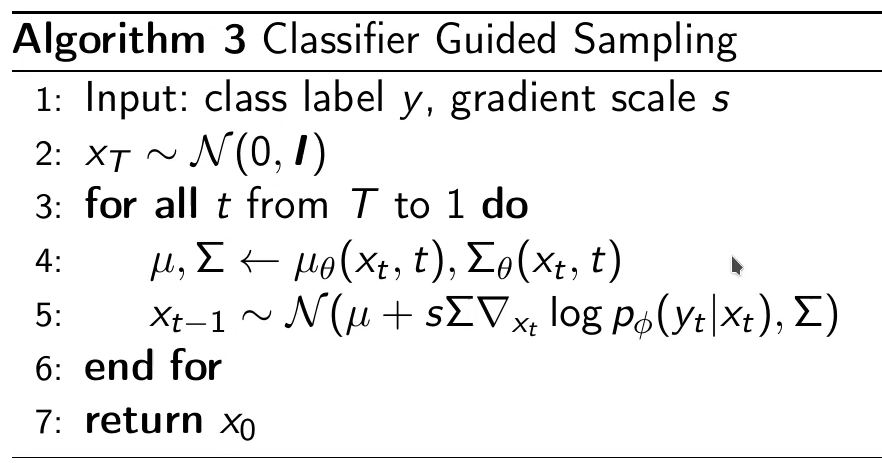

### BigGAN vs DDPM + class embeddings + gradient scale vs original data

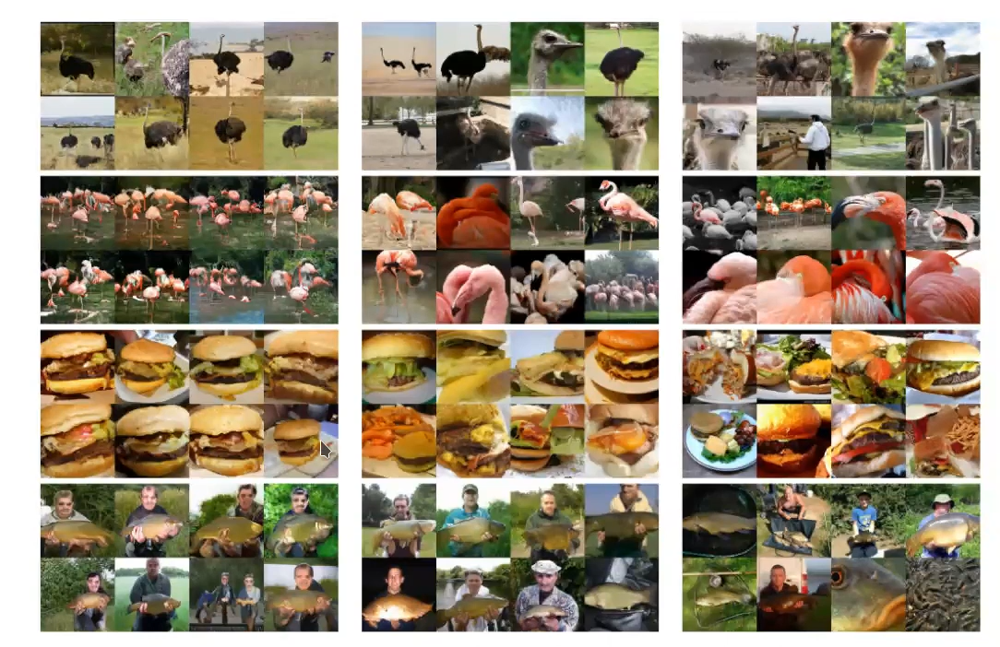

